2024-03-30 13:21:32.380826: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

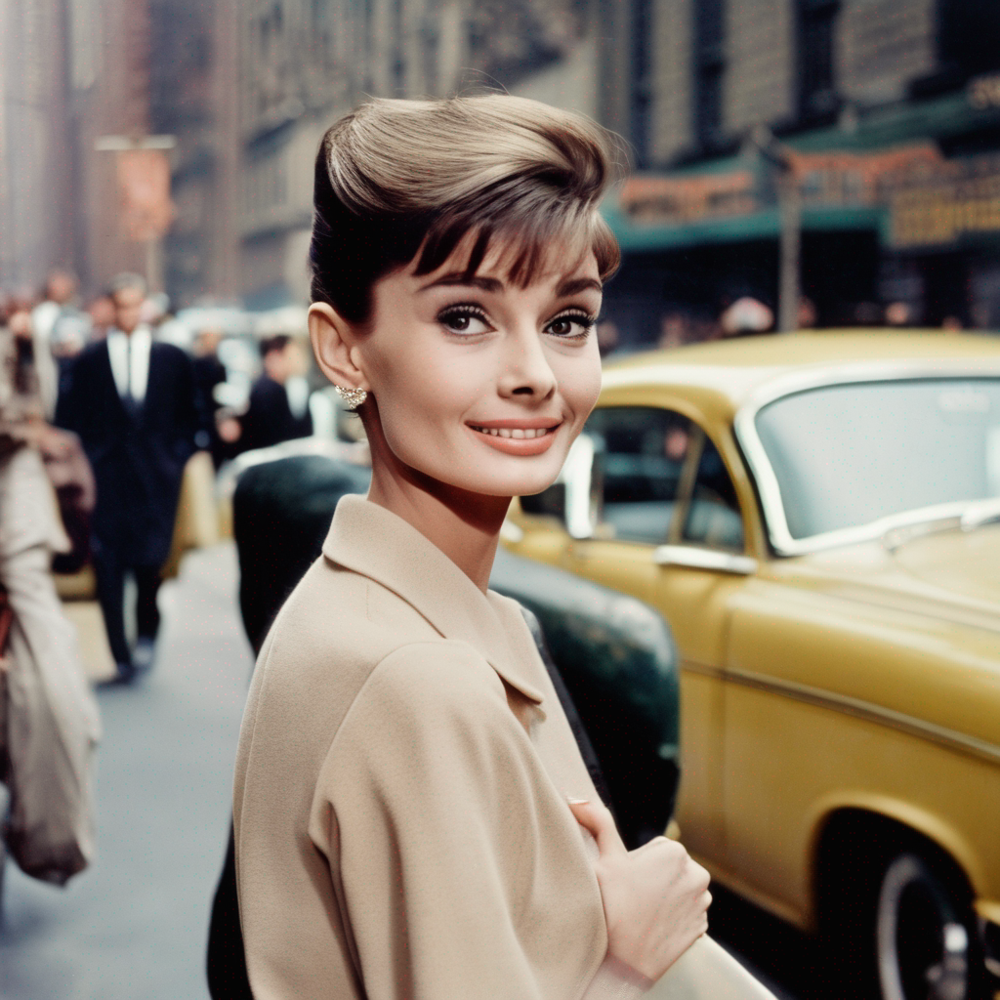

In [1]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

# if using torch < 2.0
# pipe.enable_xformers_memory_efficient_attention()

prompt = "audrey hepburn in NY, old color photograph"

images = pipe(prompt=prompt).images[0]
images

In [8]:
?pipe.__call__

Signature:
pipe.__call__(
    prompt: Union[str, List[str]] = None,
    prompt_2: Union[str, List[str], NoneType] = None,
    height: Optional[int] = None,
    width: Optional[int] = None,
    num_inference_steps: int = 50,
    timesteps: List[int] = None,
    denoising_end: Optional[float] = None,
    guidance_scale: float = 5.0,
    negative_prompt: Union[str, List[str], NoneType] = None,
    negative_prompt_2: Union[str, List[str], NoneType] = None,
    num_images_per_prompt: Optional[int] = 1,
    eta: float = 0.0,
    generator: Union[torch._C.Generator, List[torch._C.Generator], NoneType] = None,
    latents: Optional[torch.FloatTensor] = None,
    prompt_embeds: Optional[torch.FloatTensor] = None,
    negative_prompt_embeds: Optional[torch.FloatTensor] = None,
    pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
    negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
    ip_adapter_image: Union[PIL.Image.Image, numpy.ndarray, torch.FloatTensor, List[PIL.I

  0%|          | 0/50 [00:00<?, ?it/s]

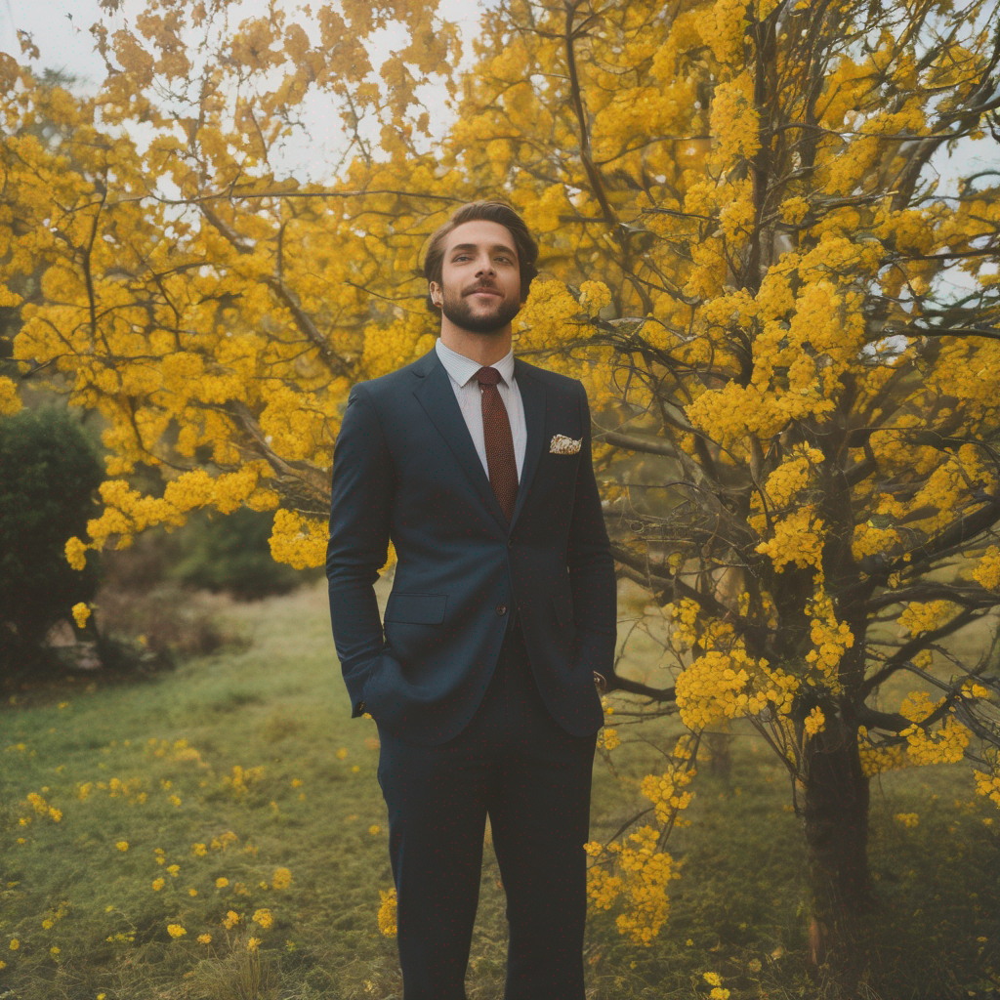

In [2]:
prompt = "happy man, 30 yo, eyes open, standing tall, holding flowers, full-length color photo"
negative_prompt = "disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w"

seed = 63
generator = torch.Generator("cuda").manual_seed(seed)

images = pipe(prompt=prompt, num_inference_steps=50, generator=generator, negative_prompt=negative_prompt).images[0]
images
# got a good photo once already, another one is OK

In [3]:
from diffusers import DiffusionPipeline, AutoencoderKL
import torch

vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix", 
    torch_dtype=torch.float16
)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipe.to("cuda");

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [2]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):
    assert len(imgs) == rows * cols

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]

    w, h = imgs[0].size
    grid_w, grid_h = cols * w, rows * h
    grid = Image.new("RGB", size=(grid_w, grid_h))

    for i, img in enumerate(imgs):
        x = i % cols * w
        y = i // cols * h
        grid.paste(img, box=(x, y))

    return grid

  0%|          | 0/25 [00:00<?, ?it/s]

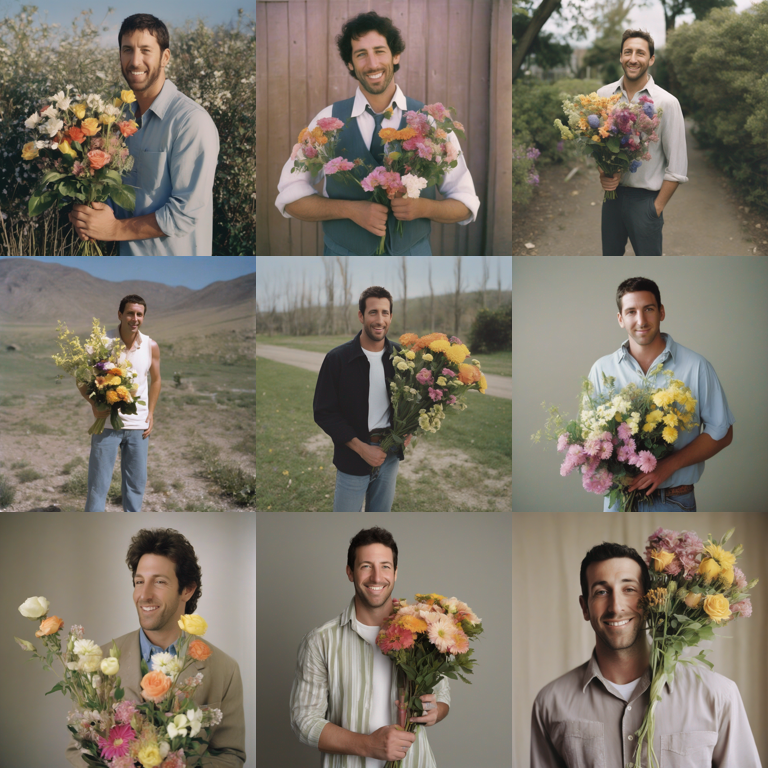

In [11]:
prompt = "happy man, 30 years old, kim clooney sandler, eyes open, standing tall, holding flowers, full-length color photo"
# prompt = "A photo of a young man at Red Square in Moscow, iphone selfie."

image = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt = 9)

image_grid(image.images, 3, 3)

  0%|          | 0/25 [00:00<?, ?it/s]

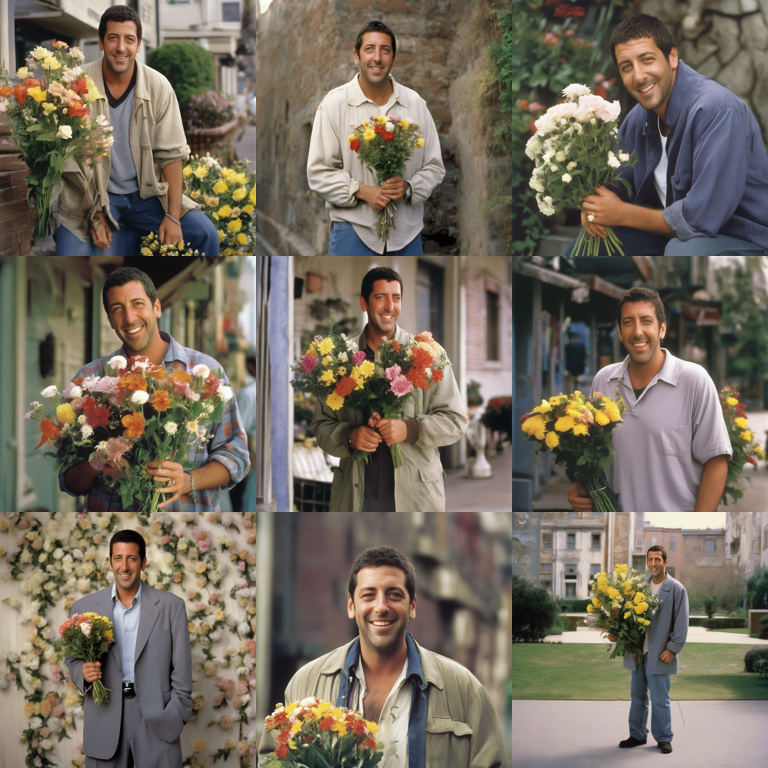

In [ ]:
prompt = "happy man, 30 years old, adam sandler, george clooney, eyes open, standing tall, holding flowers, full-length color photo"
# prompt = "A photo of a young man at Red Square in Moscow, iphone selfie."

image = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt = 9)

image_grid(image.images, 3, 3)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

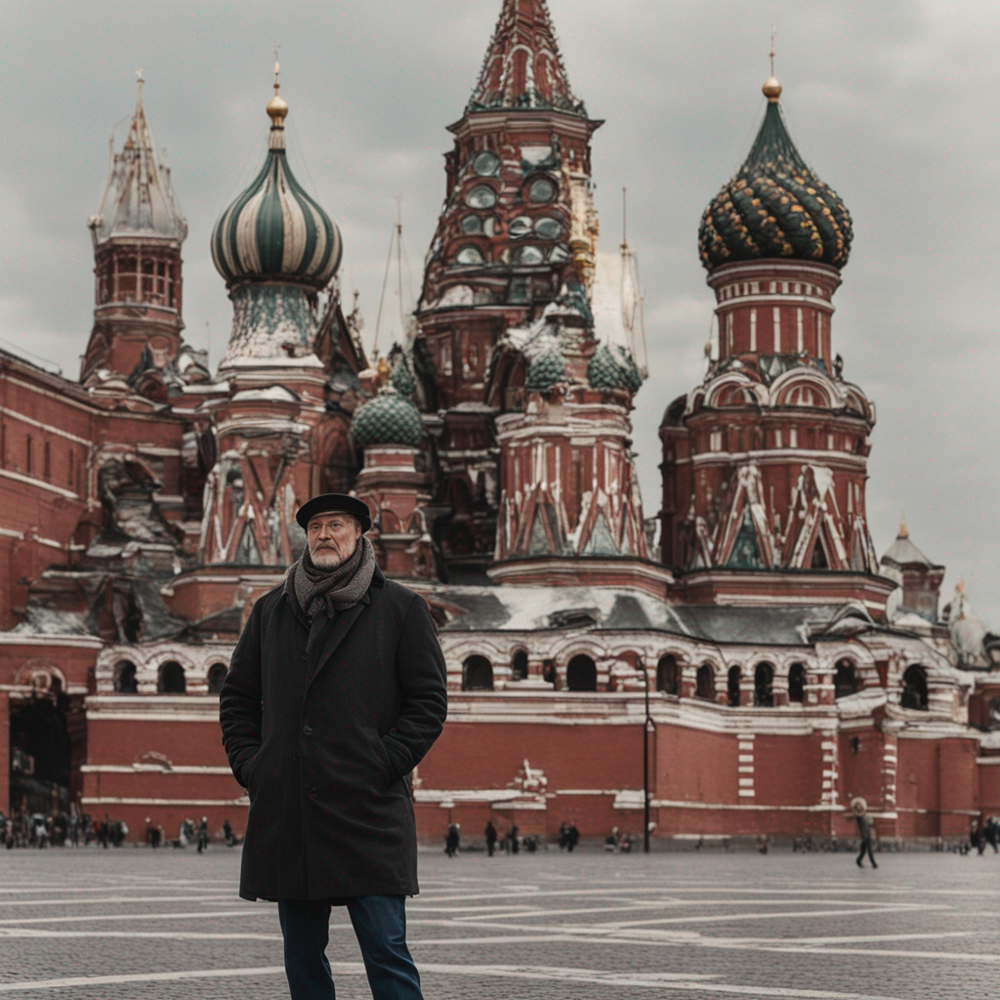

In [6]:
refiner = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)
refiner.to("cuda")

n_steps = 40
high_noise_frac = 0.7

image = pipe(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_end=high_noise_frac,
    output_type="latent",
).images

image = refiner(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_start=high_noise_frac,
    image=image,
).images[0]

image
